In [1]:
import os
import sys
sys.path.append("../src/")
from FunctionalConnectivity import FunctionalConnectivity
import pandas as pd
import pickle

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [2]:
# Load labels
labels = pd.read_csv("/cnl/abcd/data/labels/baseline_depr.csv", header=None, index_col=0)
DDC_path = "/nadata/cnl/abcd/data/imaging/fmri/rsfmri/interim/DDC/baseline/"
fig_dir = "/home/acamassa/ABCD/DDC_figures/baseline/"
weights_file_name="subc_DDC*.csv"

In [3]:
# # ## Two hemisphere FC
# two_hemi_fc = FunctionalConnectivity(
#     labels,
#     n_roi=98,
#     thrs=0.1,
#     weights_file_name="subc_DDC*.csv",
#     DDC_path=DDC_path,
#     fig_dir=fig_dir,
# )

In [4]:
# # Save output
# pickle.dump(two_hemi_fc, open("/home/acamassa/ABCD/DDC_figures/two_hemi_fc_2.pkl", "wb"))

In [3]:
pickle_file_path = "/home/acamassa/ABCD/DDC_figures/two_hemi_fc_2.pkl"

# Load the pickled object
with open(pickle_file_path, 'rb') as file:
    two_hemi_fc = pickle.load(file)

In [4]:
labels=pd.read_csv('/cnl/abcd/data/labels/baseline_depr_sex_age_hand.csv',header=None, index_col=0)
[control_R, control_L]=two_hemi_fc.get_controls_hand(labels=labels)
[depr_R, depr_L]=two_hemi_fc.get_depr_hand(labels=labels)

In [8]:
import numpy as np
R=np.nanmean(control_R,axis=0)
two_hemi_fc.plot_interactive_connectivity_graph_hand(R, state='control', save_as=None)

In [10]:
R=np.nanmean(depr_R,axis=0)
two_hemi_fc.plot_interactive_connectivity_graph_hand(R, state='depressed', save_as=None)

In [9]:
L=np.nanmean(control_L,axis=0)
two_hemi_fc.plot_interactive_connectivity_graph_hand(L, state='control', save_as=None)

In [11]:
L=np.nanmean(depr_L,axis=0)
two_hemi_fc.plot_interactive_connectivity_graph_hand(L, state='depressed', save_as=None)

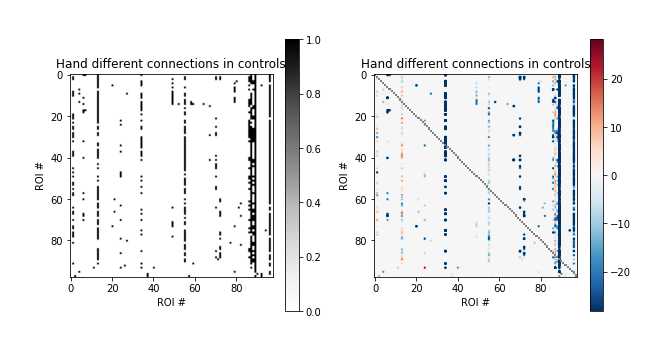

In [26]:
stat_diff_C=two_hemi_fc.plot_significant_hand_diff(control_R, control_L, condition=[0,0], colorbar=True, save_as="Controls_hand_diff.svg", bonferroni=False, ttest=0)

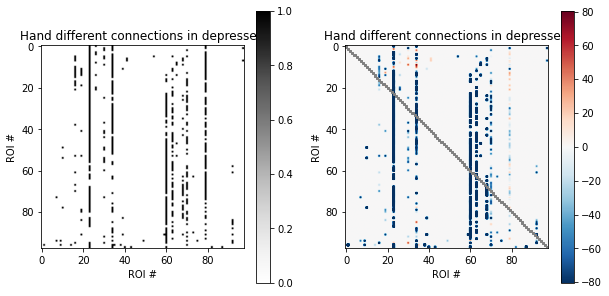

In [6]:
stat_diff_D=two_hemi_fc.plot_significant_hand_diff(depr_R, depr_L, condition=[1,1], colorbar=True, save_as="Depressed_sex_diff.svg", bonferroni=False, ttest=0)

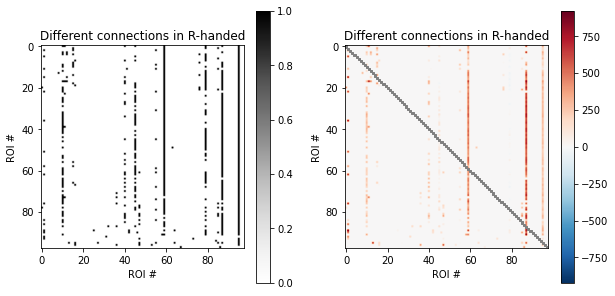

In [7]:
# depression must be the second input
stat_diff=two_hemi_fc.plot_significant_hand_diff(control_R, depr_R, condition=[0,1], colorbar=True, save_as="RightHand_diff.svg", bonferroni=False, ttest=0)

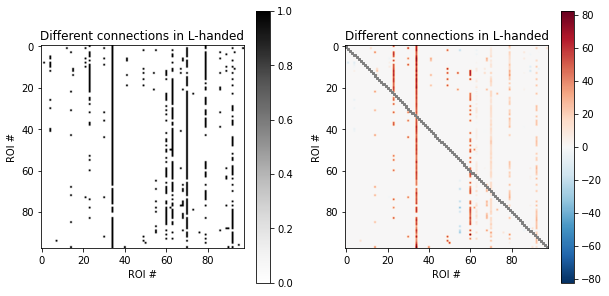

In [8]:
# depression must be the second input
stat_diff=two_hemi_fc.plot_significant_hand_diff(control_L, depr_L, condition=[1,0], colorbar="LefttHand_diff.svg", save_as=None, bonferroni=False, ttest=0)

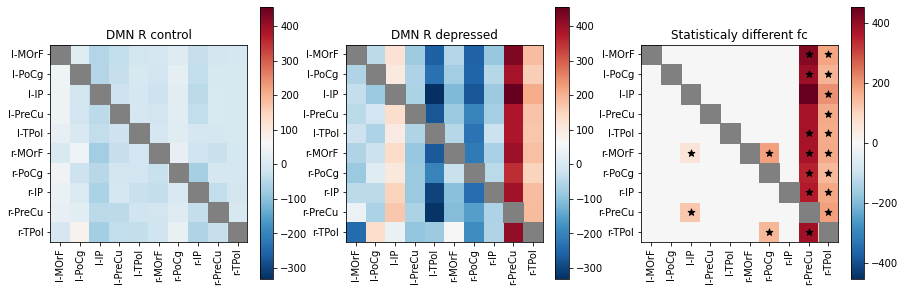

In [10]:
two_hemi_fc.plot_network_heatmap_hand(control_R, depr_R, 'DMN', hand='R', save_as="DMN_Right.svg", bonferroni=False, ttest=0)

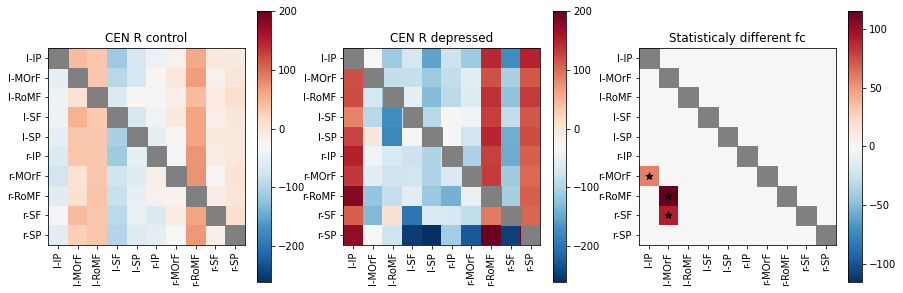

In [11]:
two_hemi_fc.plot_network_heatmap_hand(control_R, depr_R, 'CEN', hand='R', save_as="CEN_Right.svg", bonferroni=False, ttest=0)

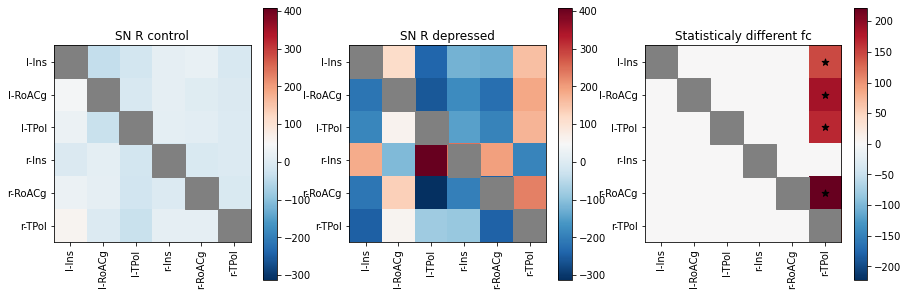

In [12]:
two_hemi_fc.plot_network_heatmap_hand(control_R, depr_R, 'SN', hand='R', save_as="SN_Right.svg", bonferroni=False, ttest=0)

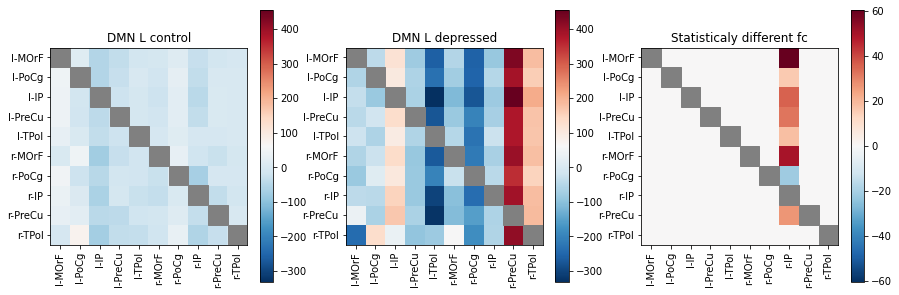

In [13]:
two_hemi_fc.plot_network_heatmap_hand(control_L, depr_L, 'DMN', hand='L', save_as="DMN_Left.svg", bonferroni=False, ttest=0)

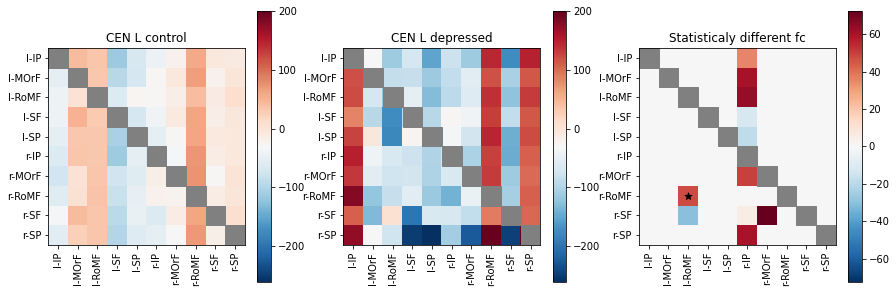

In [14]:
two_hemi_fc.plot_network_heatmap_hand(control_L, depr_L, 'CEN', hand='L', save_as="CEN_Left.svg", bonferroni=False, ttest=0)

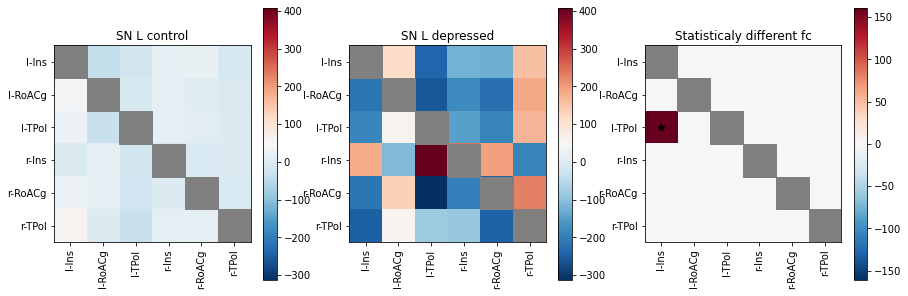

In [15]:
two_hemi_fc.plot_network_heatmap_hand(control_L, depr_L, 'SN', hand='L', save_as="SN_Left.svg", bonferroni=False, ttest=0)

/home/acamassa/anaconda3/lib/python3.9/site-packages/nilearn/plotting/displays/_projectors.py:190: UserWarning: 'adjacency_matrix' is not symmetric. A directed graph will be plotted.
  warnings.warn(


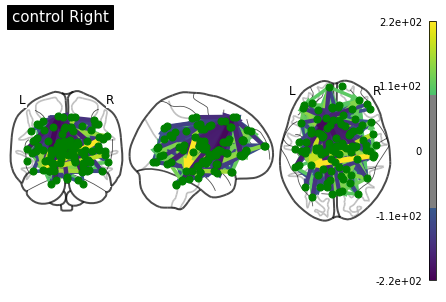

In [17]:
two_hemi_fc.plot_network_connectivity_graph_hand(control_R, state='control', hand='R')

/home/acamassa/anaconda3/lib/python3.9/site-packages/nilearn/plotting/displays/_projectors.py:190: UserWarning: 'adjacency_matrix' is not symmetric. A directed graph will be plotted.
  warnings.warn(


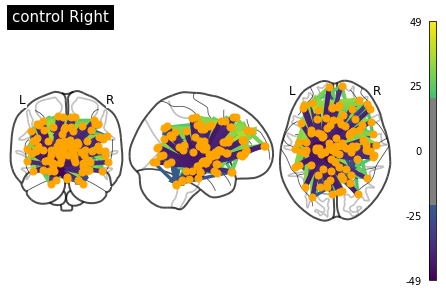

In [18]:
two_hemi_fc.plot_network_connectivity_graph_hand(control_L, state='control', hand='L')

In [19]:
import numpy as np
import networkx as nx
R=np.nanmean(control_R, axis=0)
L=np.nanmean(control_L, axis=0)


In [16]:
left = [
"l-bsts",
"l-CACg",
"l-CMF",
"l-Cu",
"l-En",
"l-Fu",
"l-IP",
"l-IT",
"l-IstCg",
"l-LO",
"l-LOrF",
"l-Lg",
"l-MOrF",
"l-MT",
"l-PaH",
"l-PaC",
"l-Op",
"l-Or",
"l-Tr",
"l-PerCa",
"l-PoC",
"l-PoCg",
"l-PreC",
"l-PreCu",
"l-RoACg",
"l-RoMF",
"l-SF",
"l-SP",
"l-ST",
"l-SM",
"l-FPol",
"l-TPol",
"l-TrT",
"l-Ins",
]

right = ["r" + label[1:] for label in left]

# Concatenate the two lists
all_ROIs =left + right

In [21]:
from pycirclize import Circos
import pandas as pd

# Create matrix data (10 x 10)
row_names = all_ROIs
col_names = row_names

matrix=R[30:,30:]
# Calculate the 95th percentile value
percentile_value = np.percentile(np.abs(matrix), 99)

# Set values below the 95th percentile to 0
filtered_matrix = np.where(np.abs(matrix) < percentile_value, 1, matrix)
matrix_df = pd.DataFrame(np.round(abs(filtered_matrix)), index=row_names, columns=col_names)
# # Specify columns and rows to remove
# columns_to_remove = ['CSF', '3V', '4V']
# rows_to_remove = ['CSF', '3V', '4V']

# # Remove specified columns
# matrix_df = matrix_df.drop(columns=columns_to_remove)
# # Remove specified rows
# matrix_df = matrix_df.drop(index=rows_to_remove)

# Initialize from matrix (Can also directly load tsv matrix file)
circos = Circos.initialize_from_matrix(
    matrix_df,
    space=1,
    cmap="tab10",
    label_kws=dict(r=94, size=8, ),
)

circos.savefig("/home/acamassa/ABCD/DDC_figures/testR.png")

In [22]:
from pycirclize import Circos
import pandas as pd

# Create matrix data (10 x 10)
row_names = all_ROIs
col_names = row_names

matrix=L[30:,30:]
# Calculate the 95th percentile value
percentile_value = np.percentile(np.abs(matrix), 99)

# Set values below the 95th percentile to 0
filtered_matrix = np.where(np.abs(matrix) < percentile_value, 1, matrix)
matrix_df = pd.DataFrame(np.round(abs(filtered_matrix)), index=row_names, columns=col_names)


# Initialize from matrix (Can also directly load tsv matrix file)
circos = Circos.initialize_from_matrix(
    matrix_df,
    space=1,
    cmap="tab10",
    label_kws=dict(r=94, size=8, ),
)

circos.savefig("/home/acamassa/ABCD/DDC_figures/testL.png")

In [23]:
R=np.nanmean(depr_R, axis=0)
L=np.nanmean(depr_L, axis=0)

In [24]:
from pycirclize import Circos
import pandas as pd

# Create matrix data (10 x 10)
row_names = all_ROIs
col_names = row_names

matrix=R[30:,30:]
# Calculate the 95th percentile value
percentile_value = np.percentile(np.abs(matrix), 99)

# Set values below the 95th percentile to 0
filtered_matrix = np.where(np.abs(matrix) < percentile_value, 1, matrix)
matrix_df = pd.DataFrame(np.round(abs(filtered_matrix)), index=row_names, columns=col_names)
# # Specify columns and rows to remove
# columns_to_remove = ['CSF', '3V', '4V']
# rows_to_remove = ['CSF', '3V', '4V']

# # Remove specified columns
# matrix_df = matrix_df.drop(columns=columns_to_remove)
# # Remove specified rows
# matrix_df = matrix_df.drop(index=rows_to_remove)

# Initialize from matrix (Can also directly load tsv matrix file)
circos = Circos.initialize_from_matrix(
    matrix_df,
    space=1,
    cmap="tab10",
    label_kws=dict(r=94, size=8, ),
)

circos.savefig("/home/acamassa/ABCD/DDC_figures/testR_depr.png")

In [25]:
from pycirclize import Circos
import pandas as pd

# Create matrix data (10 x 10)
row_names = all_ROIs
col_names = row_names

matrix=L[30:,30:]
# Calculate the 95th percentile value
percentile_value = np.percentile(np.abs(matrix), 99)

# Set values below the 95th percentile to 0
filtered_matrix = np.where(np.abs(matrix) < percentile_value, 1, matrix)
matrix_df = pd.DataFrame(np.round(abs(filtered_matrix)), index=row_names, columns=col_names)
# # Specify columns and rows to remove
# columns_to_remove = ['CSF', '3V', '4V']
# rows_to_remove = ['CSF', '3V', '4V']

# # Remove specified columns
# matrix_df = matrix_df.drop(columns=columns_to_remove)
# # Remove specified rows
# matrix_df = matrix_df.drop(index=rows_to_remove)

# Initialize from matrix (Can also directly load tsv matrix file)
circos = Circos.initialize_from_matrix(
    matrix_df,
    space=1,
    cmap="tab10",
    label_kws=dict(r=94, size=8, ),
)

circos.savefig("/home/acamassa/ABCD/DDC_figures/testL_depr.png")

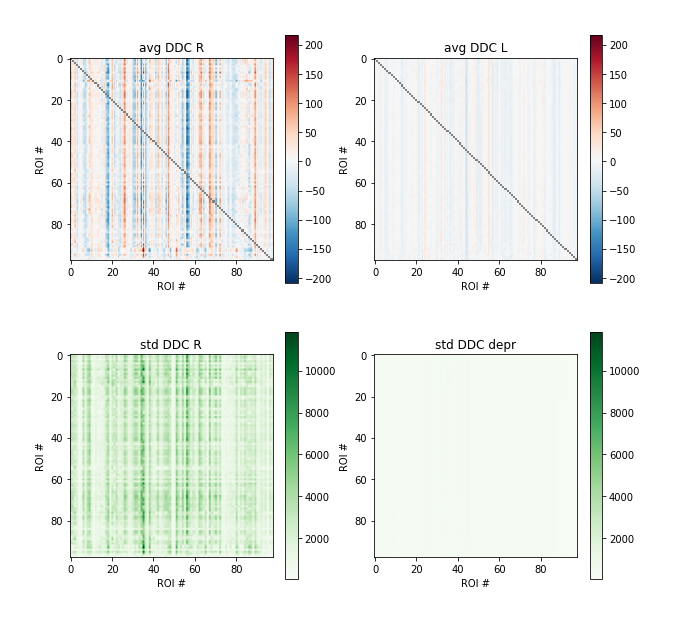

In [26]:
two_hemi_fc.plot_means_std_matrice_hand( control_R, control_L, state='control', save_as=None, cmap="Greens")

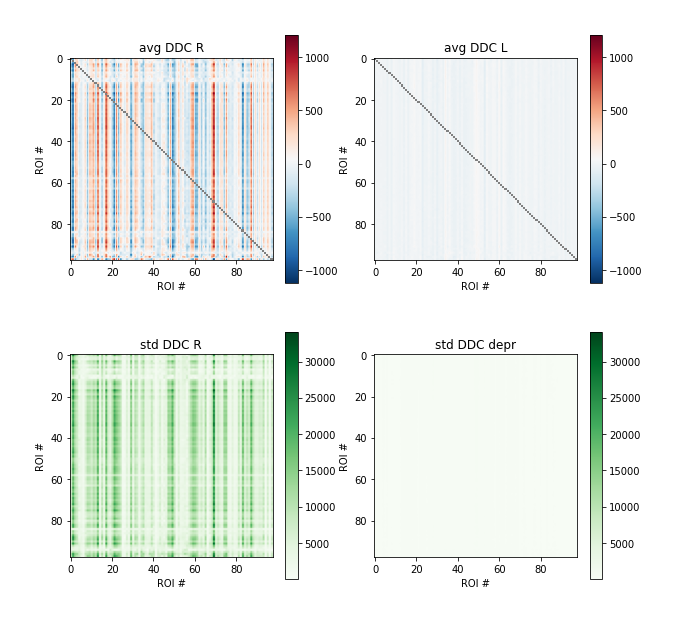

In [27]:
two_hemi_fc.plot_means_std_matrice_hand( depr_R, depr_L, state='depressed', save_as=None, cmap="Greens")

### Mean and std of controls and depressed

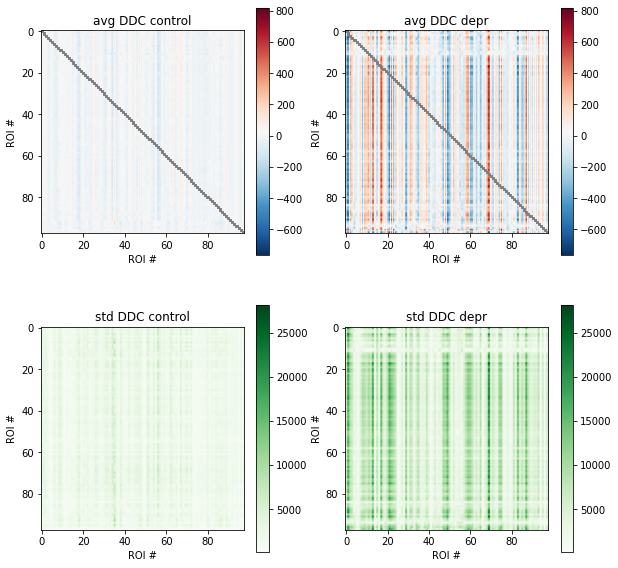

In [5]:
two_hemi_fc.plot_means_std_matrices(cmap='Greens')

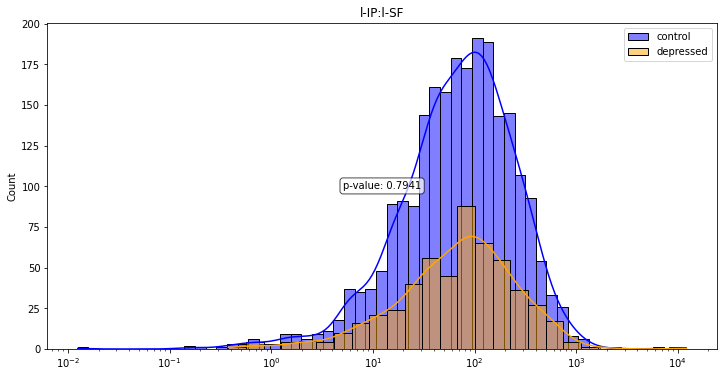

In [4]:
two_hemi_fc.plot_connection_probDistr2(x='l-IP', y='l-SF')

### Whole brain statistically different connections

array([0.00966118, 0.04123055, 0.0318113 , ..., 0.04653689, 0.05031702,
       0.01937924])

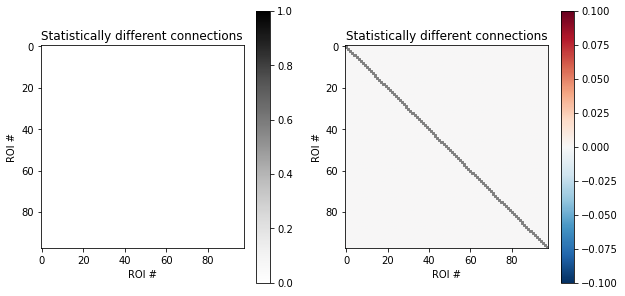

In [6]:
two_hemi_fc.plot_significant_connections_matrix(bonferroni=True)

array([0.00966118, 0.04123055, 0.0318113 , ..., 0.04653689, 0.05031702,
       0.01937924])

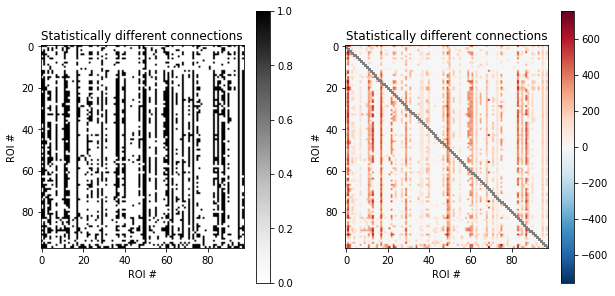

In [7]:
two_hemi_fc.plot_significant_connections_matrix(bonferroni=False)

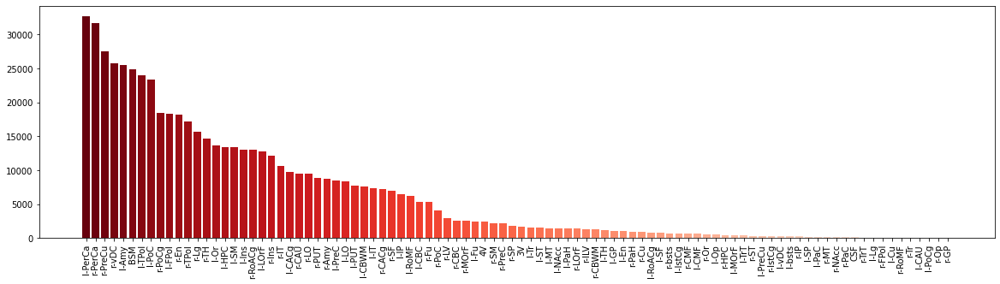

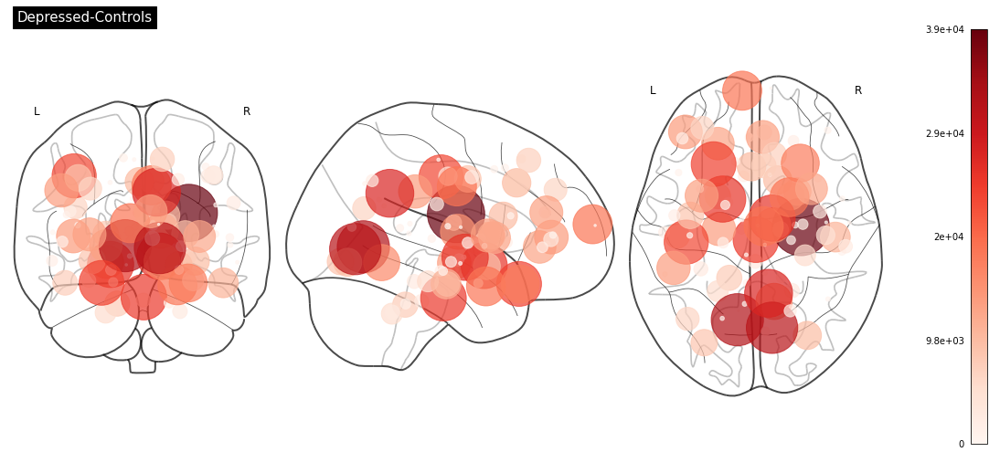

In [6]:
two_hemi_fc.plot_significant_connections_bar(bonferroni=False)

In [ ]:
from nilearn import plotting
import numpy as np
import seaborn as sns



positions = pd.read_csv(
                "/nadata/cnl/abcd/data/imaging/fmri/rsfmri/interim/segmented/baseline/downloads/sub-NDARINV04GAB2AA/ROIs_centroid_coordinates.csv"
            )
coord_list = np.asarray(positions[["x", "y", "z"]])

import matplotlib.pyplot as plt
fig=plt.figure(figsize=(15,7))
plotting.plot_markers(
    diff,
    coord_list,
    node_cmap="RdBu_r",
    figure=fig,
    node_vmin=-2e-18,
    node_vmax=2e-18,
    node_size=abs(np.mean(control,axis=0))*4e20,
    title="Controls average activation per ROI",
)
plt.savefig("/home/acamassa/ABCD/DDC_figures/Controls_activation_map.svg")

### Subnetwork statistically different connections

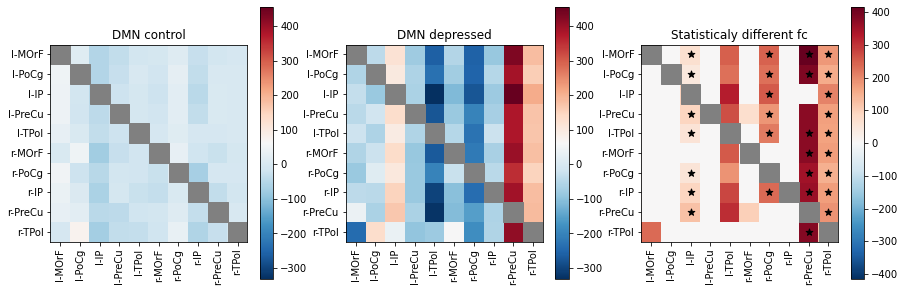

In [5]:
two_hemi_fc.plot_network_heatmap("DMN")

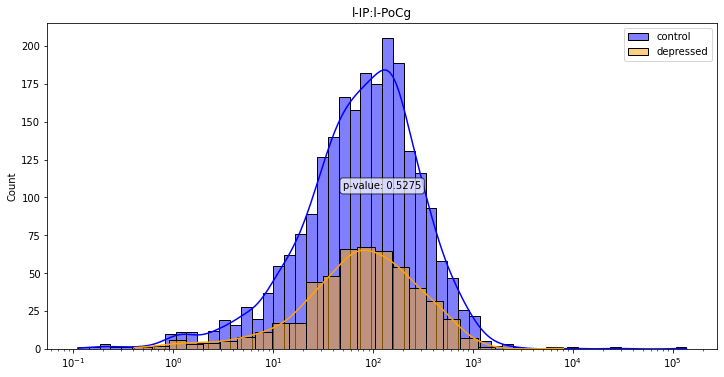

In [8]:
two_hemi_fc.plot_connection_probDistr2(x='l-IP', y='l-PoCg')

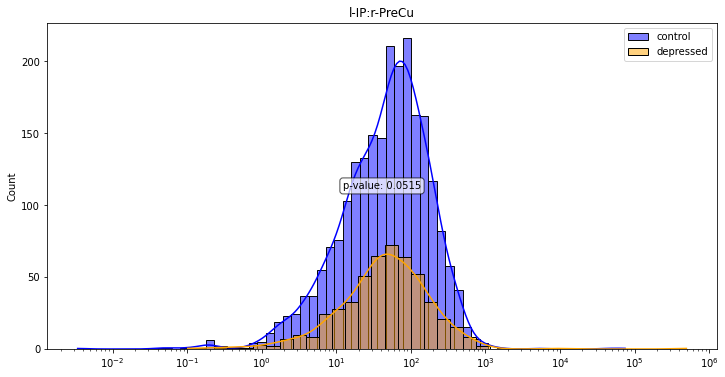

In [6]:
two_hemi_fc.plot_connection_probDistr2(x='l-IP', y='r-PreCu')

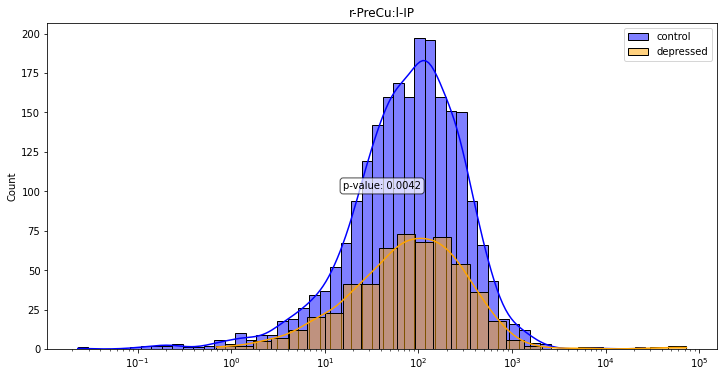

In [7]:
two_hemi_fc.plot_connection_probDistr2(x='r-PreCu', y='l-IP')

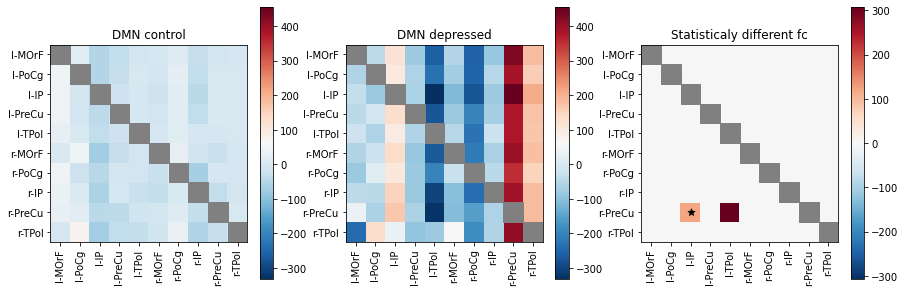

In [10]:
two_hemi_fc.plot_network_heatmap("DMN", bonferroni=True)

/home/acamassa/anaconda3/lib/python3.9/site-packages/nilearn/plotting/displays/_projectors.py:190: UserWarning: 'adjacency_matrix' is not symmetric. A directed graph will be plotted.
  warnings.warn(


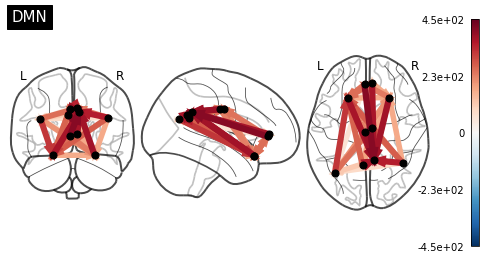

In [11]:
two_hemi_fc.plot_network_connectivity_graph_diff("DMN", ev=400, bonferroni=False)

In [12]:
two_hemi_fc.plot_network_significant_connections_graph("DMN")

TypeError: '_AxesStack' object is not callable

<Figure size 360x360 with 0 Axes>

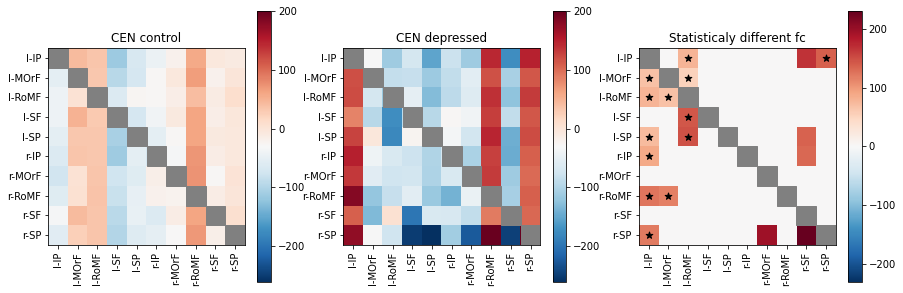

In [13]:
two_hemi_fc.plot_network_heatmap("CEN")

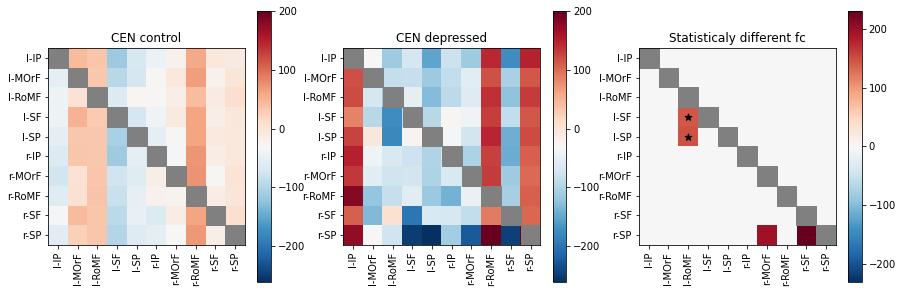

In [14]:
diff=two_hemi_fc.plot_network_heatmap("CEN", bonferroni=True)

In [16]:
# two_hemi_fc.plot_network_significant_connections_graph("CEN")

/home/acamassa/anaconda3/lib/python3.9/site-packages/nilearn/plotting/displays/_projectors.py:190: UserWarning: 'adjacency_matrix' is not symmetric. A directed graph will be plotted.
  warnings.warn(


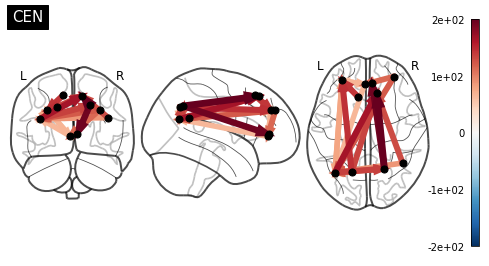

In [17]:
two_hemi_fc.plot_network_connectivity_graph_diff("CEN", ev=None, bonferroni=False)

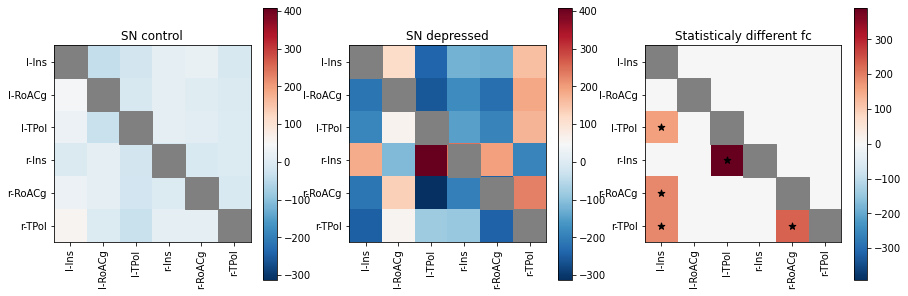

In [18]:
two_hemi_fc.plot_network_heatmap("SN", bonferroni=True)

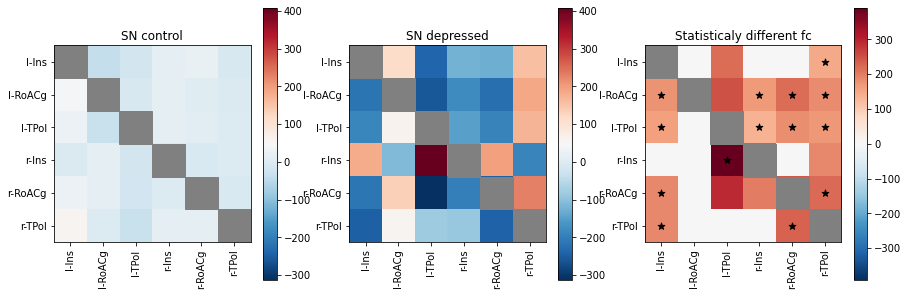

In [19]:
two_hemi_fc.plot_network_heatmap("SN")

/home/acamassa/anaconda3/lib/python3.9/site-packages/nilearn/plotting/displays/_projectors.py:190: UserWarning: 'adjacency_matrix' is not symmetric. A directed graph will be plotted.
  warnings.warn(


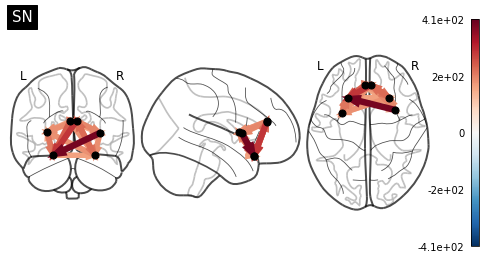

In [20]:
two_hemi_fc.plot_network_connectivity_graph_diff("SN", ev=200, bonferroni=False)

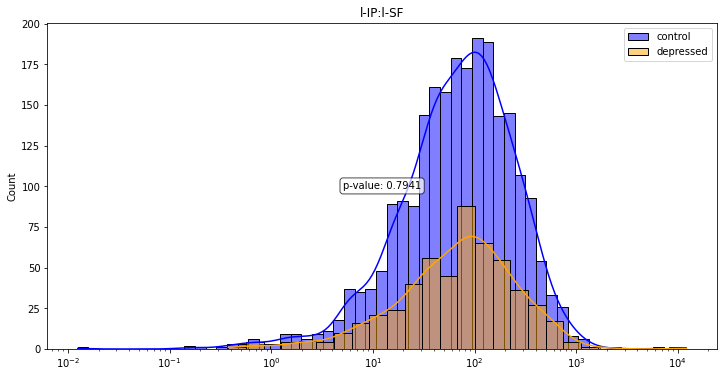

In [21]:
two_hemi_fc.plot_connection_probDistr(x='l-IP', y='l-SF')

In [10]:
two_hemi_fc.plot_interactive_connectivity_graph_diff()

/home/acamassa/.local/lib/python3.9/site-packages/nilearn/plotting/js_plotting_utils.py:76: UserWarning: you have specified symmetric_cmap=False but the map contains negative values; setting symmetric_cmap to True
  warnings.warn('you have specified symmetric_cmap=False '


In [25]:
df = pd.read_csv('/cnl/abcd/data/tabular/raw/abcd_ehis01.txt', sep='\t')
df.head()

,collection_id,abcd_ehis01_id,dataset_id,subjectkey,src_subject_id,interview_date,interview_age,sex,eventname,ehi1b,ehi2b,ehi3b,ehi4b,ehi_time,ehi_y_ss_scoreb,collection_title,study_cohort_name
0,collection_id,abcd_ehis01_id,dataset_id,The NDAR Global Unique Identifier (GUID) for r...,Subject ID how it's defined in lab/project,Date on which the interview/genetic test/sampl...,Age in months at the time of the interview/tes...,Sex of subject at birth,The event name for which the data was collected,Writing,Throwing,Toothbrush,Spoon,Current Time:,Handedness score rating,collection_title,study_cohort_name
1,2573,32824,47076,NDAR_INV0CBPKF6W,NDAR_INV0CBPKF6W,06/06/2017,122,M,baseline_year_1_arm_1,100,100,100,100,10:06,1,Adolescent Brain Cognitive Development Study (...,ABCD 4.0 Data Release
2,2573,32833,47076,NDAR_INV0CTJAAHC,NDAR_INV0CTJAAHC,02/01/2018,118,M,baseline_year_1_arm_1,100,100,100,100,12:49,1,Adolescent Brain Cognitive Development Study (...,ABCD 4.0 Data Release
3,2573,32840,47076,NDAR_INV0DBRJXKG,NDAR_INV0DBRJXKG,02/23/2017,130,F,baseline_year_1_arm_1,100,100,0,100,08:55,1,Adolescent Brain Cognitive Development Study (...,ABCD 4.0 Data Release
4,2573,32848,47076,NDAR_INV0DWBRWHT,NDAR_INV0DWBRWHT,04/09/2018,127,M,baseline_year_1_arm_1,100,100,50,100,16:15,1,Adolescent Brain Cognitive Development Study (...,ABCD 4.0 Data Release


In [26]:
df[['subjectkey','ehi_y_ss_scoreb']]

,subjectkey,ehi_y_ss_scoreb
0,The NDAR Global Unique Identifier (GUID) for r...,Handedness score rating
1,NDAR_INV0CBPKF6W,1
2,NDAR_INV0CTJAAHC,1
3,NDAR_INV0DBRJXKG,1
4,NDAR_INV0DWBRWHT,1
...,...,...
11872,NDAR_INVNT49PTFA,1
11873,NDAR_INVNTBRC1TA,1
11874,NDAR_INVNTD0Y2TZ,3
11875,NDAR_INVNTUN0CBE,1


### Regularized DDC

In [ ]:
RegDDC = FunctionalConnectivity(
    labels,
    n_roi=98,
    thrs=0.8,
    weights_file_name="subc_Reg_DDC*.csv",
    DDC_path=DDC_path,
    fig_dir=fig_dir,
)

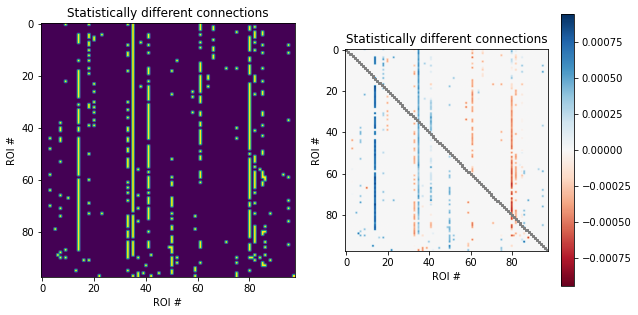

In [ ]:
RegDDC.plot_significant_connections_matrix()

In [ ]:
RegDDC.plot_interactive_connectivity_graph_diff()

/home/acamassa/anaconda3/lib/python3.9/site-packages/nilearn/plotting/js_plotting_utils.py:76: UserWarning: you have specified symmetric_cmap=False but the map contains negative values; setting symmetric_cmap to True
  warnings.warn('you have specified symmetric_cmap=False '
/home/acamassa/anaconda3/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 0.0009407160506627096. But, you have given threshold=50 
  warnings.warn("The given float value must not exceed {0}. "


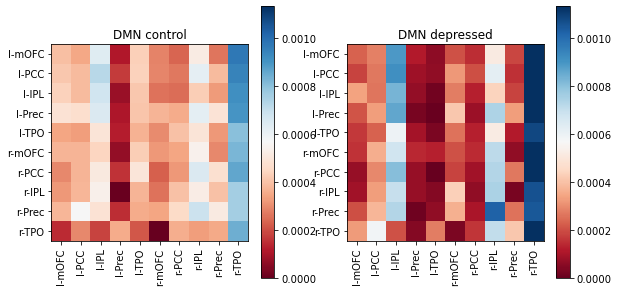

In [ ]:
RegDDC.plot_network_heatmap("DMN")

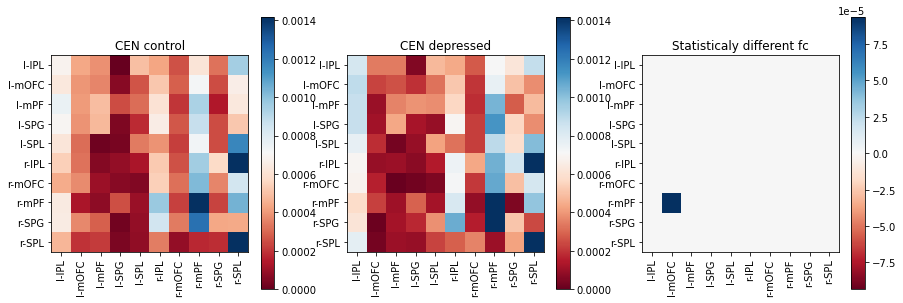

In [ ]:
RegDDC.plot_network_heatmap("CEN")

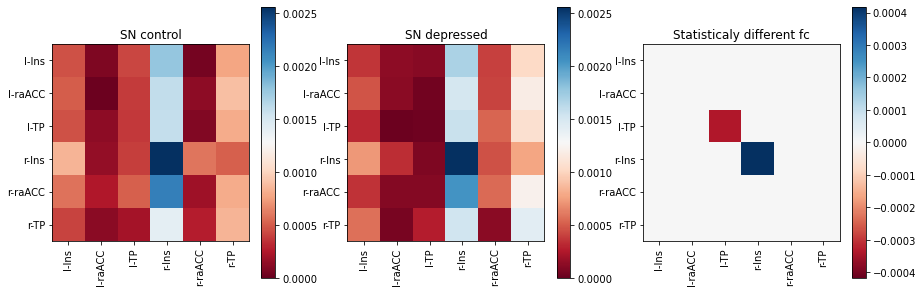

In [ ]:
RegDDC.plot_network_heatmap("SN")

### Covariance

In [ ]:
cov = FunctionalConnectivity(
    labels,
    n_roi=98,
    thrs=0.8,
    weights_file_name="subc_Cov*.csv",
    DDC_path=DDC_path,
    fig_dir=fig_dir,
)

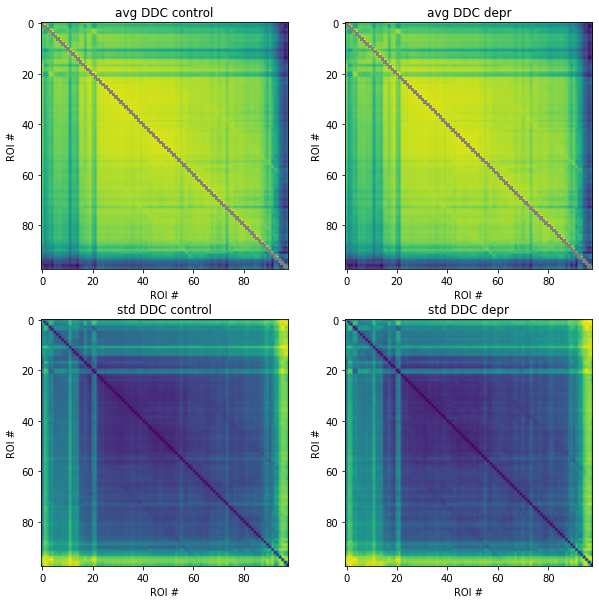

In [ ]:
cov.plot_means_std_matrices()

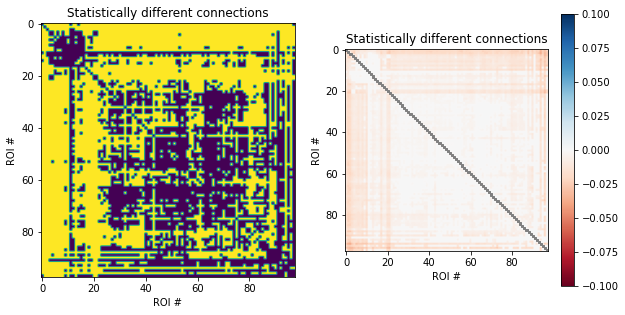

In [ ]:
cov.plot_significant_connections_matrix()

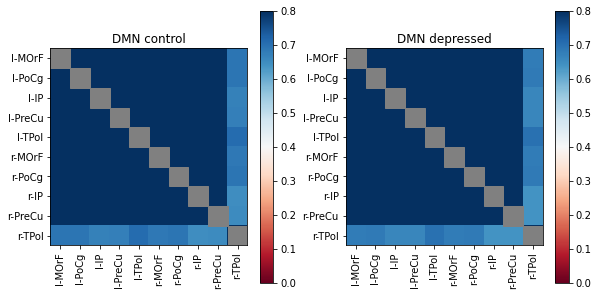

In [ ]:
cov.plot_network_heatmap("DMN")

In [ ]:
cov.plot_network_connectivity_graph_diff("DMN", ev=0.001)

no different connections to plot


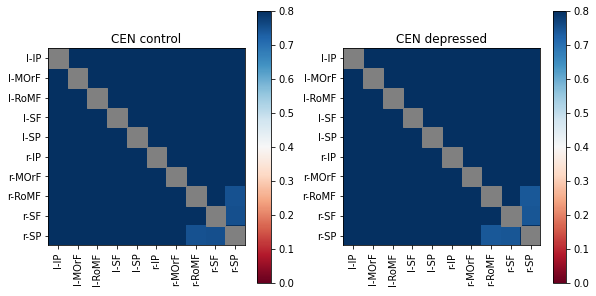

In [ ]:
cov.plot_network_heatmap("CEN")

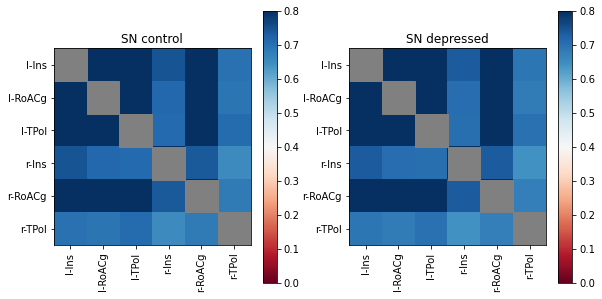

In [ ]:
cov.plot_network_heatmap("SN")